In [13]:
# Utils
import torch
import torchvision.transforms as trans
from PIL import Image
torch.pi = torch.acos(torch.zeros(1)).item() * 2

In [14]:
def Te2p(e_img, h_fov, v_fov, u_deg, v_deg, out_hw, in_rot_deg=torch.tensor([0.]), mode='bilinear'):
    '''
    e_img:   ndarray in shape of [H, W, *]
    h_fov,v_fov: scalar or (scalar, scalar) field of view in degree
    u_deg:   horizon viewing angle in range [-180, 180]
    v_deg:   vertical viewing angle in range [-90, 90]
    '''
    b, c, h, w = e_img.shape
    
    h_fov, v_fov = h_fov * torch.pi / 180., v_fov * torch.pi / 180.
    
    in_rot = in_rot_deg * torch.pi / 180.
    
    if mode == 'bilinear':
        order = 1
    elif mode == 'nearest':
        order = 0
    else:
        raise NotImplementedError('unknown mode')

    u = -u_deg * torch.pi / 180.
    v = v_deg * torch.pi / 180.
    xyz = Txyzpers(h_fov, v_fov, u, v, out_hw, in_rot)
    uv = Txyz2uv(xyz)
    coor_xy = Tuv2coor(uv, torch.tensor([h], dtype = float), torch.tensor([w], dtype = float))
    mid = torch.tensor([w/2.,h/2.]).reshape(1,1,2)
    cords = (coor_xy-mid)/mid
    pers_img = torch.nn.functional.grid_sample(input=e_img, grid = cords.unsqueeze(0).float(), align_corners=True, mode = mode)
    return pers_img,coor_xy

def TgetCors(h_fov, v_fov, u_deg, v_deg, out_hw, in_rot_deg=torch.tensor([0.]), mode='bilinear'):
    '''
    e_img_shape:   [b,c,h,w]
    h_fov,v_fov: scalar or (scalar, scalar) field of view in degree
    u_deg:   horizon viewing angle in range [-180, 180]
    v_deg:   vertical viewing angle in range [-90, 90]
    '''
    
    h_fov, v_fov = h_fov * torch.pi / 180., v_fov * torch.pi / 180.
    
    in_rot = in_rot_deg * torch.pi / 180.
    
    if mode == 'bilinear':
        order = 1
    elif mode == 'nearest':
        order = 0
    else:
        raise NotImplementedError('unknown mode')

    u = -u_deg * torch.pi / 180.
    v = v_deg * torch.pi / 180.
    xyz = Txyzpers(h_fov, v_fov, u, v, out_hw, in_rot)
    uv = Txyz2uv(xyz)
    coor_xy = Tuv2coor(uv, torch.tensor([h], dtype = float), torch.tensor([w], dtype = float))
    return coor_xy.long()
    

def Tuv2coor(uv, h, w):
    '''
    uv: ndarray in shape of [..., 2]
    h: int, height of the equirectangular image
    w: int, width of the equirectangular image
    '''
    u, v = torch.split(uv, 1, -1)
    coor_x = (u / (2 * torch.pi) + 0.5) * w - 0.5
    coor_y = (-v / torch.pi + 0.5) * h - 0.5
    return torch.cat([coor_x, coor_y], -1)

def Tcoor2uv(coorxy, h, w):
    coor_x, coor_y = torch.split(coorxy, 1, -1)
    u = ((coor_x + 0.5) / w - 0.5) * 2 * torch.pi
    v = -((coor_y + 0.5) / h - 0.5) * torch.pi
    return torch.cat([u, v], -1)


def Tuv2unitxyz(uv):
    u, v = torch.split(uv, 1, -1)
    y = torch.sin(v)
    c = torch.cos(v)
    x = c * np.sin(u)
    z = c * np.cos(u)

    return torch.cat([x, y, z], dim=-1)

def Txyz2uv(xyz):
    '''
    xyz: ndarray in shape of [..., 3]
    '''
    x, y, z = torch.split(xyz, 1, -1)
    u = torch.atan2(x, z)
    c = torch.sqrt(x**2 + z**2)
    v = torch.atan2(y, c)

    return torch.cat([u, v], -1)




def Trotation_matrix(rad, ax):
    """
    rad : torch.tensor, Eg. torch.tensor([2.0])
    ax  : torch.tensor, Eg. [1,0,0] or [0,1,0] or [0,0,1]
    """
    ax = ax / torch.pow(ax,2).sum()
    R = torch.diag(torch.cat([torch.cos(rad)]*3))
    R = R + torch.outer(ax, ax) * (1.0 - torch.cos(rad))
    ax = ax * torch.sin(rad)
    R = R + torch.tensor([[0, -ax[2], ax[1]],
                          [ax[2], 0, -ax[0]],
                          [-ax[1], ax[0], 0]], dtype = ax.dtype)
    return R

def Txyzpers(h_fov, v_fov, u, v, out_hw, in_rot):
    out = torch.ones((*out_hw, 3), dtype=float)
    x_max = torch.tan(torch.tensor([h_fov / 2])).item()
    y_max = torch.tan(torch.tensor([v_fov / 2])).item()
    x_rng = torch.linspace(-x_max, x_max, out_hw[1], dtype=float)
    y_rng = torch.linspace(-y_max, y_max, out_hw[0], dtype=float)
    out[..., :2] = torch.stack(torch.meshgrid(x_rng, -y_rng), -1).permute(1,0,2)
    Rx = Trotation_matrix(v, torch.tensor([1, 0, 0],dtype=float))
    Ry = Trotation_matrix(u, torch.tensor([0, 1, 0],dtype=float))
    dots = (torch.tensor([[0,0,1]],dtype=float)@Rx)@Ry
    Ri = Trotation_matrix(in_rot, dots[0])
    return ((out@Rx)@Ry)@Ri

In [15]:
im = Image.open("/home/keshav/data/finalEgok360/images/Desk_work/Desk_work/0547/0.jpg")

In [52]:
Timnp = trans.ToTensor()(im).unsqueeze(0)
# gheTimnp = trans.ToTensor()(im).unsqueeze(0)
# img,idx = Te2p(e_img = Timnp, 
#             h_fov = torch.tensor([45.]), 
#             v_fov = torch.tensor([45.]), 
#             u_deg = torch.tensor([-100.]), 
#             v_deg = torch.tensor([0.]), 
#             out_hw = (100,100),
#             in_rot_deg = torch.tensor([0.]),
#             mode = 'bilinear')

# N,C,H,W  = Timnp.shape
# trans.ToPILImage()(img[0])
from matplotlib import cm

cmaps = [('Perceptually Uniform Sequential', [
            'viridis', 'plasma', 'inferno', 'magma', 'cividis']),
         ('Sequential', [
            'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
            'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
            'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']),
         ('Sequential (2)', [
            'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink',
            'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia',
            'hot', 'afmhot', 'gist_heat', 'copper']),
         ('Diverging', [
            'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu',
            'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic']),
         ('Cyclic', ['twilight', 'twilight_shifted', 'hsv']),
         ('Qualitative', [
            'Pastel1', 'Pastel2', 'Paired', 'Accent',
            'Dark2', 'Set1', 'Set2', 'Set3',
            'tab10', 'tab20', 'tab20b', 'tab20c']),
         ('Miscellaneous', [
            'flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern',
            'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg',
            'gist_rainbow', 'rainbow', 'jet', 'nipy_spectral', 'gist_ncar'])]

getcolors = lambda n:cm.get_cmap('plasma', n).colors


def getuvCenter(u_size=4,v_size=4):
    v = torch.linspace(90,-90,v_size)
    u = torch.linspace(-180,180,u_size)
    vdiff = torch.abs(v[1]-v[0]).long()
    udiff = torch.abs(u[1]-u[0]).long()
    uvCenter = torch.stack(torch.meshgrid([v,u]),-1).reshape(-1,2)
    return uvCenter,udiff,vdiff

from tqdm import tqdm

def tweak(u_deg =-180., v_deg = 90., get_idx = False, get_img = False,color=[1.,0,0.]):
    N = 1
    uvCenter, udiff,vdiff = getuvCenter(4,4)
    imglist = []
    colors = getcolors(49).tolist()
    for i,(v,u) in tqdm(enumerate(uvCenter)):
        Timnp = trans.ToTensor()(im).unsqueeze(0)
        img,idx = Te2p(e_img = Timnp, 
                h_fov = torch.tensor([udiff.item()+18]), 
                v_fov = torch.tensor([vdiff.item()+9]), 
                u_deg = torch.tensor([u]), 
                v_deg = torch.tensor([v]), 
                out_hw = (3200,6400),
                in_rot_deg = torch.tensor([180.]),
                mode = 'nearest')
#         idx = torch.nn.functional.interpolate(idx.unsqueeze(0), size=(320,640))[0]
        idx_chunked = idx.long().chunk(2, 2)
        
#         return img
        if get_idx:
            return idx
        if get_img:
            return img,idx
        Timnp[torch.arange(N).view(N, 1), :, idx_chunked[1].squeeze(), idx_chunked[0].squeeze()] = torch.tensor(colors[i][:-1]).reshape(1,1,1,-1)
        imglist.append(Timnp)
    return imglist
#         return Timnp[:, :, idx_chunked[1].squeeze(), idx_chunked[0].squeeze()]# = img.permute(0,1,2,3)
    return trans.ToPILImage()(Timnp[0])

In [17]:
def applyProjection(img_dim = (1,320,640,3),
                    gridu=4,
                    gridv=4,
                    pad=4,
                    sample_factor=10):
    uvCenter, udiff, vdiff = getuvCenter(gridu, gridv)
    colors = [torch.tensor(c[:-1]).reshape(1,-1,1,1) for c in getcolors(gridu * gridv).tolist()]
    h_fov = torch.tensor([udiff + pad * 2])
    v_fov = torch.tensor([vdiff + pad])
    scale_hw = (v_fov.item() * sample_factor, h_fov.item() * sample_factor)
    fovlist = []
    for i, (v, u) in tqdm(enumerate(uvCenter)):
        _,idx = Te2p(e_img = Timnp, 
                h_fov = h_fov, 
                v_fov = v_fov, 
                u_deg = torch.tensor([u]), 
                v_deg = torch.tensor([v]), 
                out_hw = scale_hw,
                in_rot_deg = torch.tensor([180.]),
                mode = 'nearest')
        fovlist.append(idx)

    def morphNNFunc(nn_func=None, e_img=None):
        nn_func = nn_func if nn_func else lambda x,i:colors[i]
        for i, idx in enumerate(fovlist):
            idx_chunked = idx.long().chunk(2, 2)
            e_img[:, :, idx_chunked[1].squeeze(), idx_chunked[0].squeeze()] = nn_func(e_img[:, :, idx_chunked[1].squeeze(), idx_chunked[0].squeeze()],i)
        return e_img
    return morphNNFunc

In [18]:
ap = applyProjection()

16it [00:00, 22.20it/s]


In [19]:
Timnp

tensor([[[[0.4392, 0.4392, 0.4392,  ..., 0.4275, 0.4275, 0.4275],
          [0.4353, 0.4353, 0.4353,  ..., 0.4275, 0.4275, 0.4275],
          [0.4314, 0.4314, 0.4314,  ..., 0.4196, 0.4196, 0.4196],
          ...,
          [0.2706, 0.2745, 0.2784,  ..., 0.2784, 0.2784, 0.2784],
          [0.2627, 0.2667, 0.2706,  ..., 0.2627, 0.2627, 0.2627],
          [0.2510, 0.2549, 0.2588,  ..., 0.2510, 0.2549, 0.2549]],

         [[0.4471, 0.4471, 0.4471,  ..., 0.4353, 0.4353, 0.4353],
          [0.4431, 0.4431, 0.4431,  ..., 0.4353, 0.4353, 0.4353],
          [0.4392, 0.4392, 0.4392,  ..., 0.4275, 0.4275, 0.4275],
          ...,
          [0.0078, 0.0118, 0.0157,  ..., 0.0157, 0.0157, 0.0157],
          [0.0039, 0.0078, 0.0157,  ..., 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0078, 0.0118,  ..., 0.0039, 0.0078, 0.0078]],

         [[0.4275, 0.4275, 0.4275,  ..., 0.4157, 0.4157, 0.4157],
          [0.4235, 0.4235, 0.4235,  ..., 0.4157, 0.4157, 0.4157],
          [0.4196, 0.4196, 0.4196,  ..., 0

In [20]:
Timnp = trans.ToTensor()(im).unsqueeze(0)

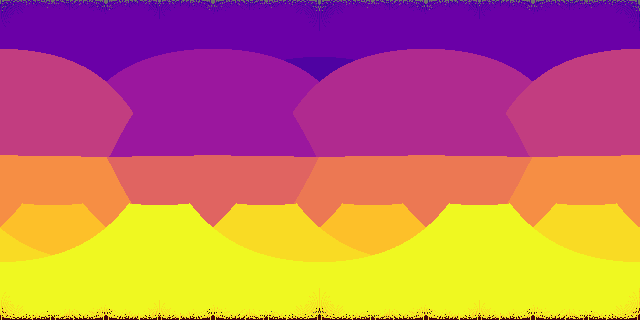

In [21]:
trans.ToPILImage()(ap(e_img = Timnp)[0])

In [22]:
# cm.get_cmap?

In [23]:
# torch.nn.functional.interpolate?

In [24]:
# out = tweak()
trans.ToPILImage()(out[0])

NameError: name 'out' is not defined

0it [00:01, ?it/s]


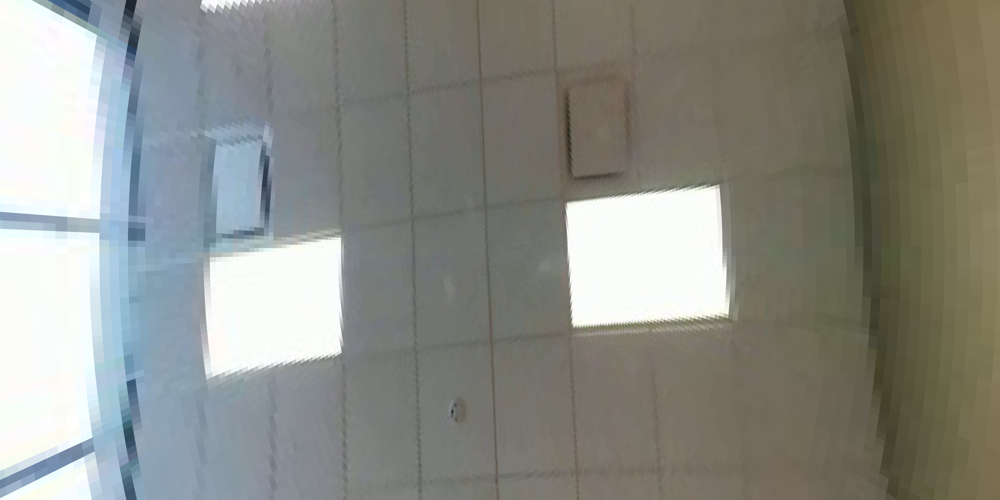

In [25]:
out = tweak()
trans.ToPILImage()(out[0])

In [281]:
# cm.get_cmap?

In [282]:
colors = getcolors(49)
color
# colors.tolist()

NameError: name 'color' is not defined

In [283]:
# colors.colors

In [284]:
out = tweak()

16it [00:00, 79.70it/s]


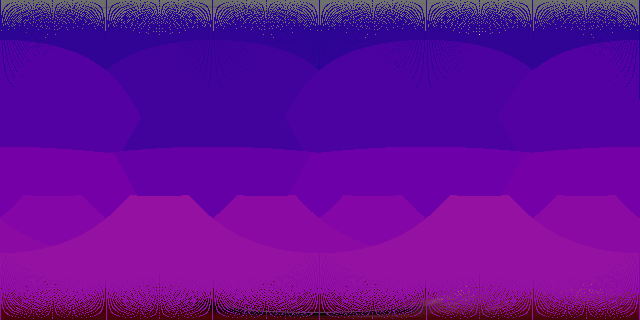

In [285]:
out

In [48]:
import torch

In [49]:
uvCenter,_,_ = getuvCenter()

In [53]:
uvCenter

tensor([[  90., -180.],
        [  90.,  -60.],
        [  90.,   60.],
        [  90.,  180.],
        [  30., -180.],
        [  30.,  -60.],
        [  30.,   60.],
        [  30.,  180.],
        [ -30., -180.],
        [ -30.,  -60.],
        [ -30.,   60.],
        [ -30.,  180.],
        [ -90., -180.],
        [ -90.,  -60.],
        [ -90.,   60.],
        [ -90.,  180.]])

In [54]:
imgs = []
for i in uvCenter:
    imgs.append(tweak(u_deg = i[1], v_deg = i[0]))

16it [00:21,  1.37s/it]
16it [00:21,  1.34s/it]
16it [00:22,  1.38s/it]
16it [00:22,  1.43s/it]
16it [00:23,  1.49s/it]
16it [00:21,  1.35s/it]
16it [00:23,  1.47s/it]
16it [00:22,  1.42s/it]
16it [00:23,  1.45s/it]
16it [00:22,  1.38s/it]
16it [00:21,  1.36s/it]
16it [00:21,  1.33s/it]
16it [00:21,  1.32s/it]
16it [00:21,  1.32s/it]
16it [00:21,  1.33s/it]
16it [00:21,  1.33s/it]


In [85]:
ls

im_conv/                             pylikwid/
numpy_projector.py                   test.py
numpy_projector.py.lprof             test.py.lprof
output.png                           torchlatest.yml
output.pstats                        torch_projector.py
perf.data                            torch_projector.py.lprof
Performance_Evaluation_Python.ipynb  tt.py
profile.pstats                       _unt.ipynb
Projector.ipynb                      Untitled.ipynb
ProjectorTorch.ipynb


In [84]:
lst1 = imgs[0]
for i in range(1,17):
    trans.ToPILImage()(lst1[i-1][0])
# lst1[0]

IndexError: list index out of range

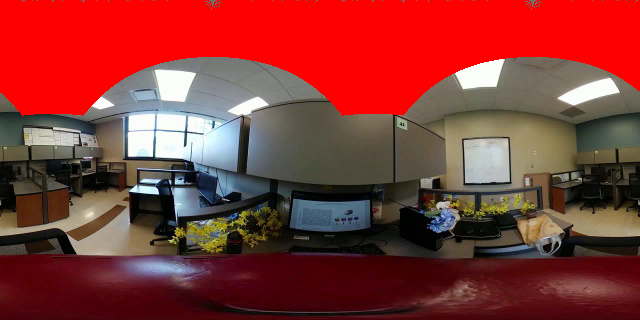

In [91]:
imgs[1]

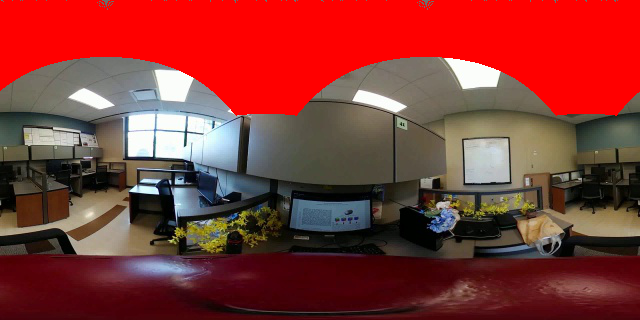

In [92]:
imgs[2]

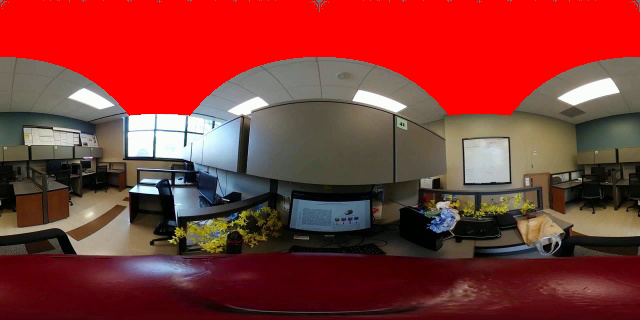

In [93]:
imgs[3]

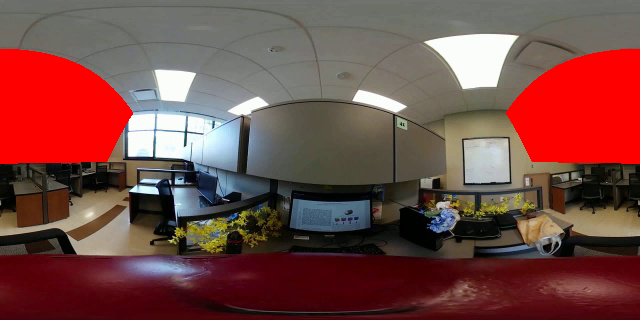

In [94]:
imgs[4]

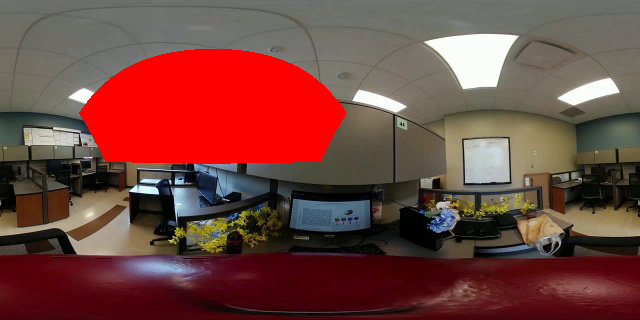

In [95]:
imgs[5]

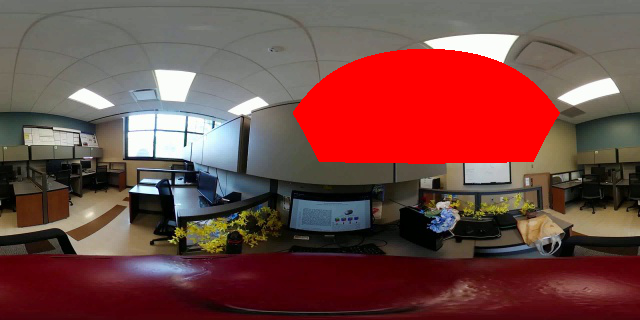

In [96]:
imgs[6]

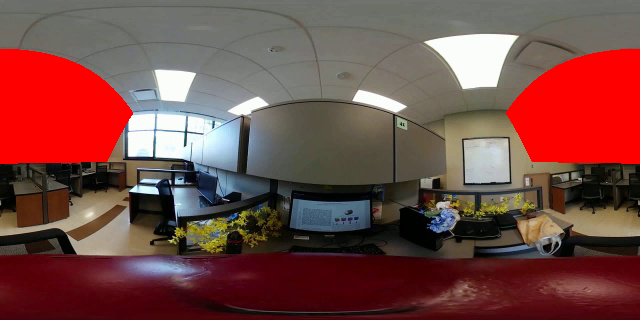

In [97]:
imgs[7]

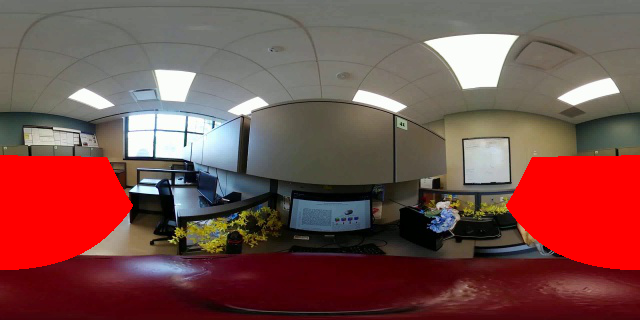

In [98]:
imgs[8]

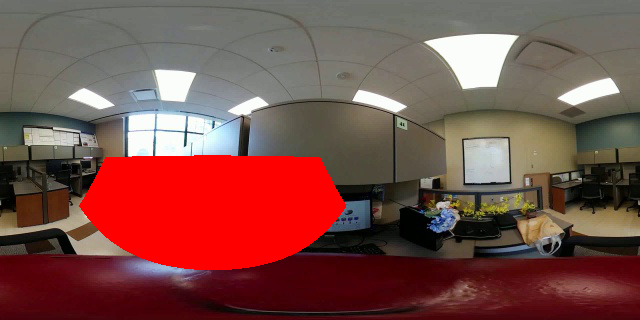

In [99]:
imgs[9]

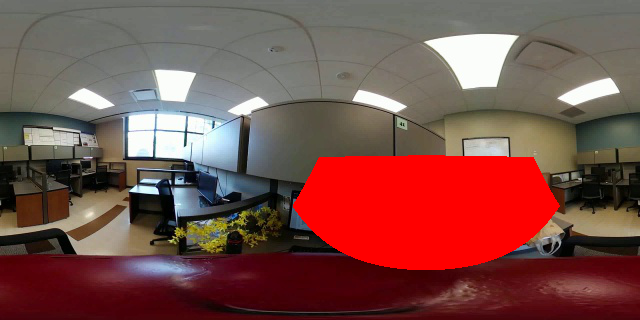

In [100]:
imgs[10]

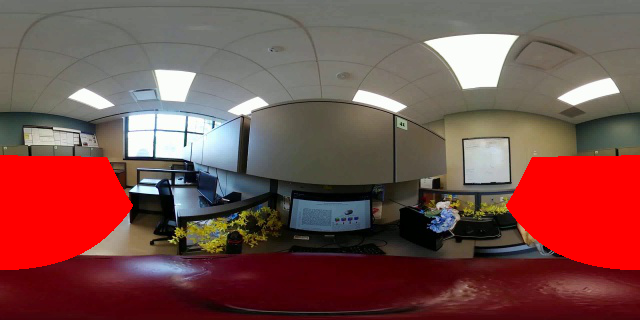

In [101]:
imgs[11]

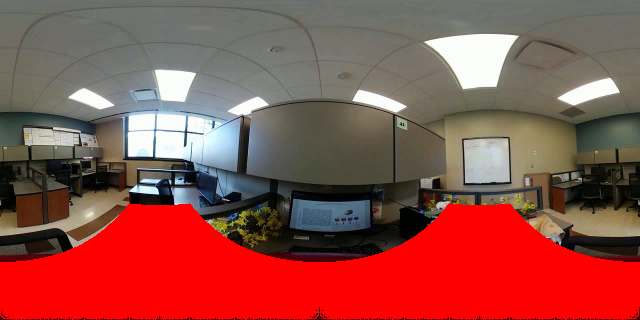

In [102]:
imgs[12]

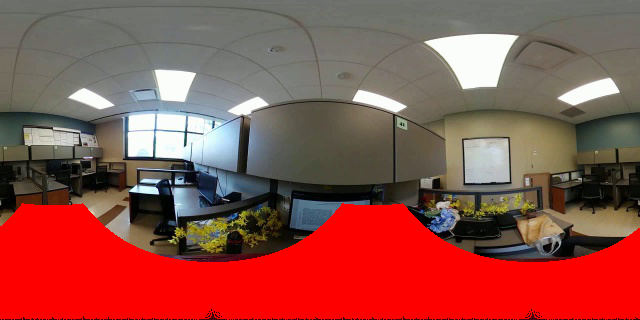

In [103]:
imgs[13]

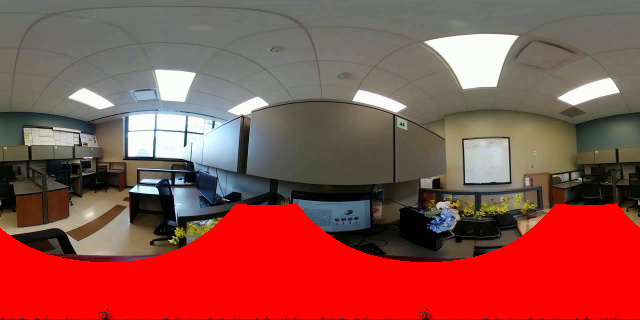

In [104]:
imgs[14]

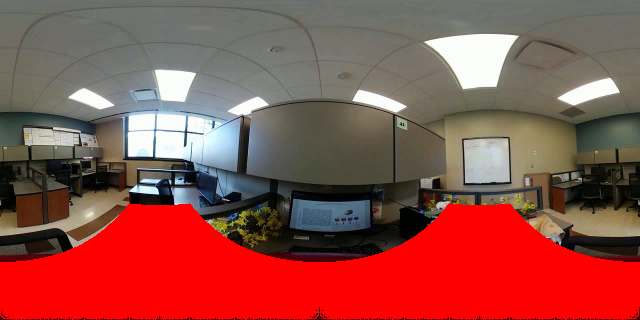

In [105]:
imgs[15]

In [84]:
# imgs[16]

In [6]:
torch.__version__

'1.7.0'

In [7]:
# Timnp.shape

In [8]:
im.size

(640, 320)

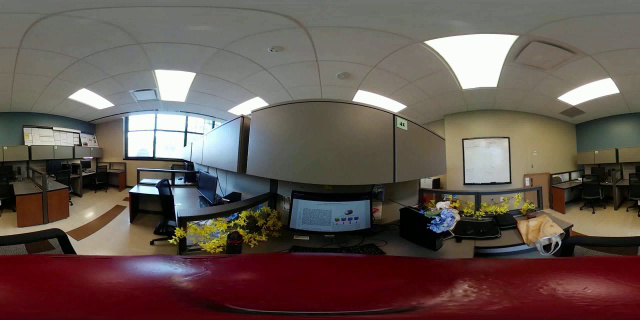

In [9]:
im

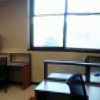

In [10]:
trans.ToPILImage()(img[0])

In [11]:
# trans.ToPILImage()(tweak(get_img=True)[0][0])

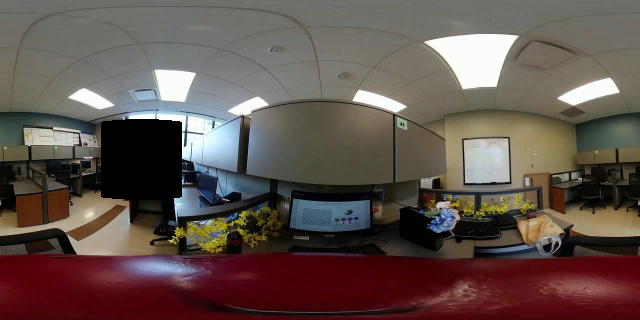

In [39]:
idx_chunked = idx.long().chunk(2, 2)
Timnp[torch.arange(N).view(N, 1), :, idx_chunked[1].squeeze(), idx_chunked[0].squeeze()] = 0
trans.ToPILImage()(Timnp[0])

In [40]:
# idx_chunked = idx.long().chunk(2, 2)
# Timnp[torch.arange(N).view(N, 1), :, idx_chunked[1].squeeze(), idx_chunked[0].squeeze()] = 0
# trans.ToPILImage()(Timnp[0])

In [41]:
# idx_chunked = idx.long().chunk(2, 2)
# Timnp[torch.arange(N).view(N, 1), :, idx_chunked[1].squeeze(), idx_chunked[0].squeeze()] = 0
# trans.ToPILImage()(Timnp[0])

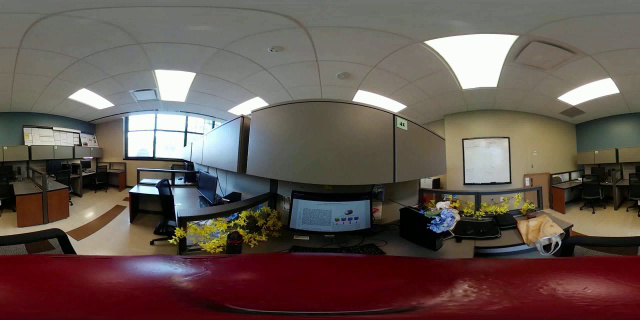

In [42]:
im

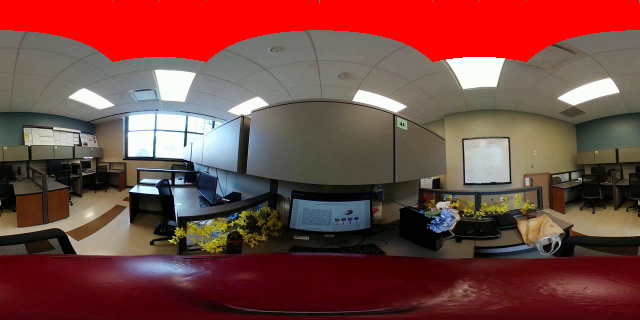

In [45]:
tweak(u_deg =-180., v_deg = 90., get_idx = False, get_img = False,color=[1.,0,0.])

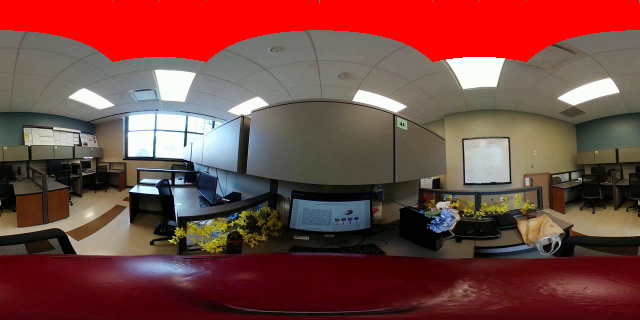

In [59]:
tweak(u_deg =0., v_deg = 90., get_idx = False, get_img = False,color=[1.,0,0.])

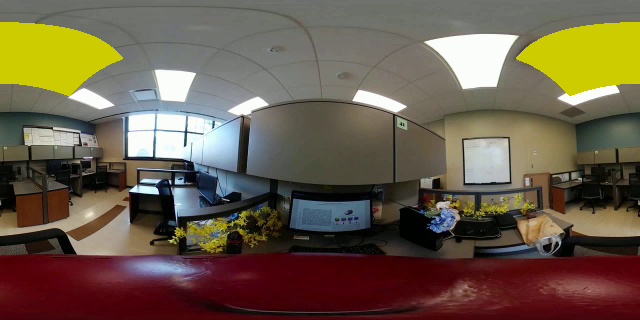

In [47]:
tweak(v_deg = 60.,color = [0.8,0.8,0])

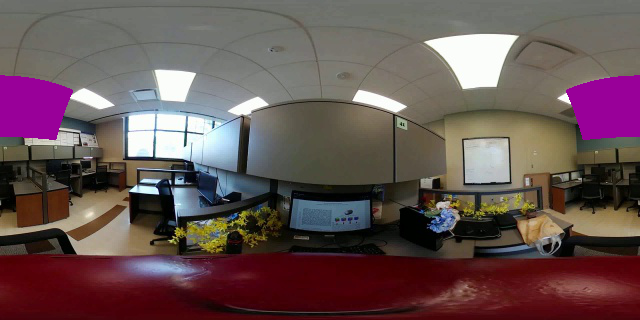

In [48]:
tweak(v_deg = 30.,color=[0.6,0,0.6])

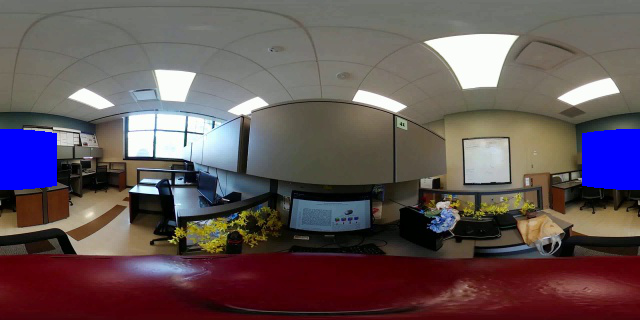

In [20]:
tweak(v_deg = 0.,color = [0,0.,1.0])

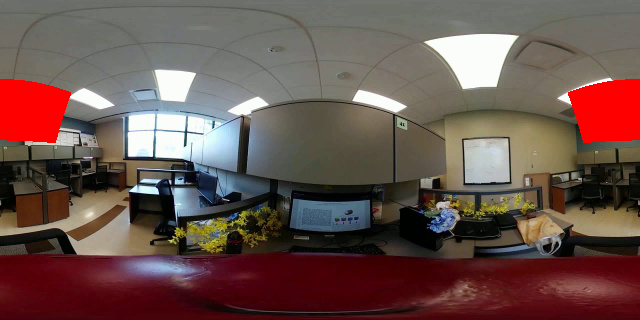

In [21]:
tweak(v_deg = 28.)

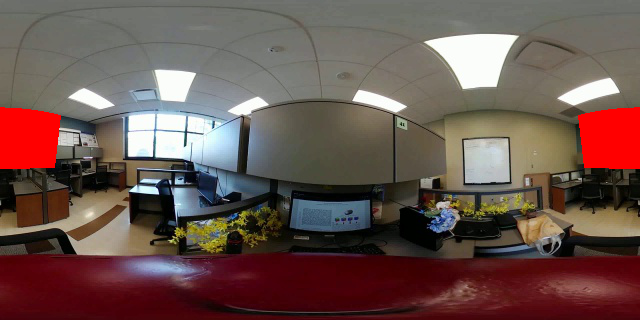

In [22]:
tweak(v_deg = 12.)

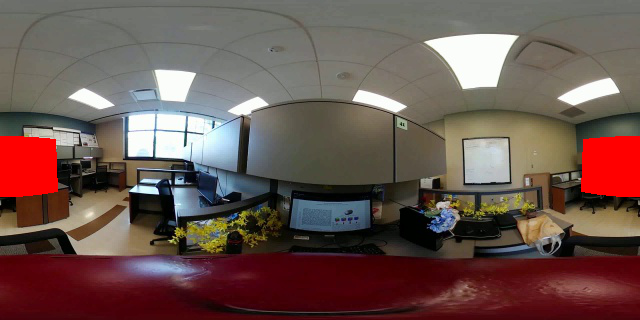

In [23]:
tweak(v_deg = -4.)

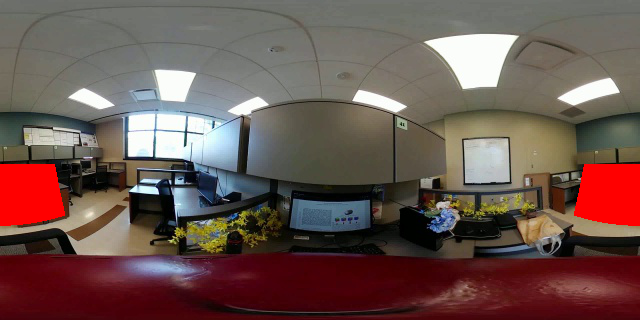

In [24]:
tweak(v_deg = -20.)

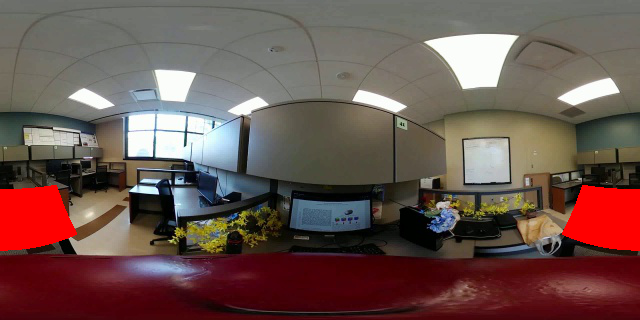

In [25]:
tweak(v_deg = -34.)

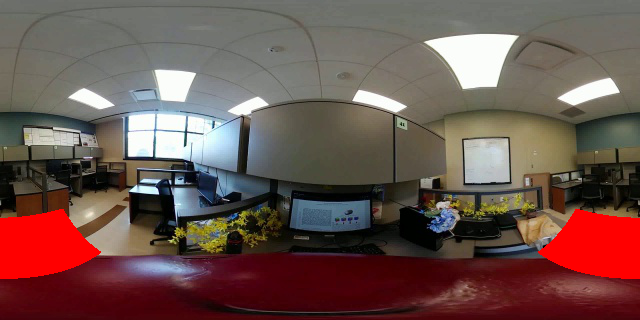

In [26]:
tweak(v_deg = -50.)

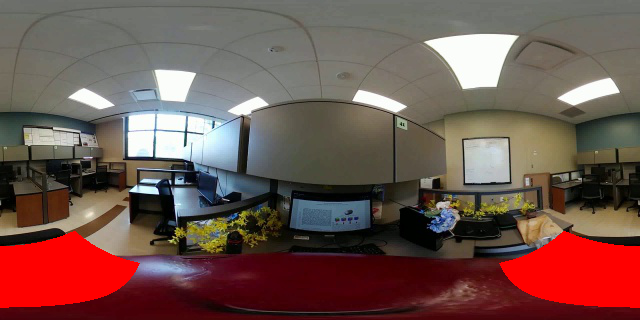

In [27]:
tweak(v_deg = -66.)

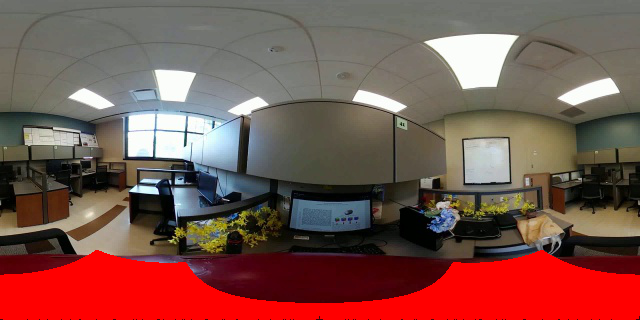

In [28]:
tweak(v_deg = -82.)

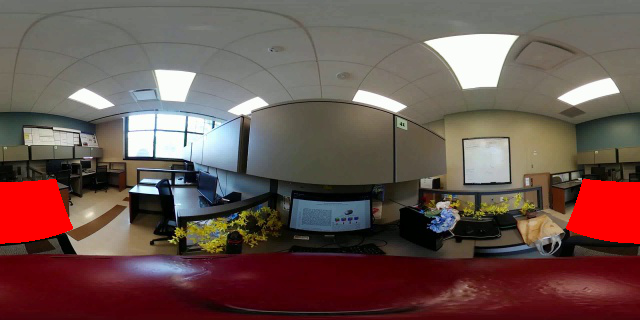

In [29]:
tweak(v_deg = -30.)

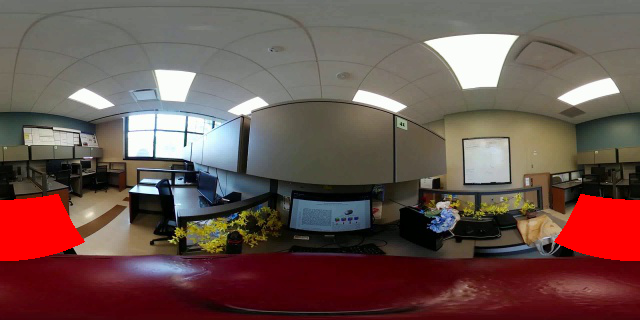

In [30]:
tweak(v_deg = -40.)

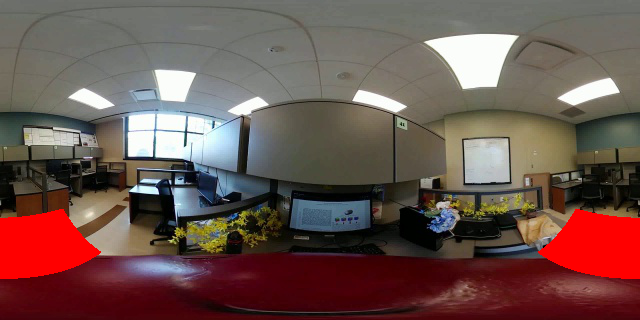

In [31]:
tweak(v_deg = -50.)

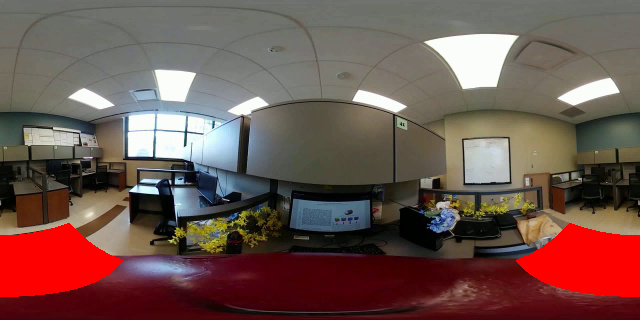

In [32]:
tweak(v_deg = -60.)

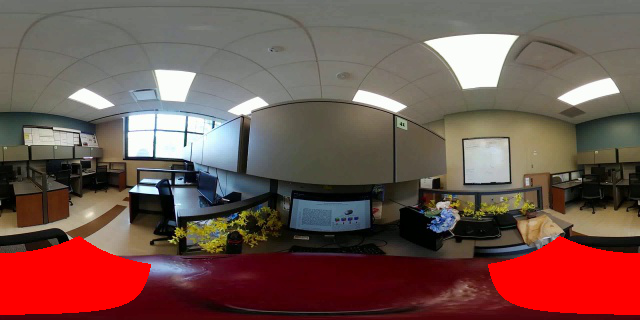

In [33]:
tweak(v_deg = -70.)

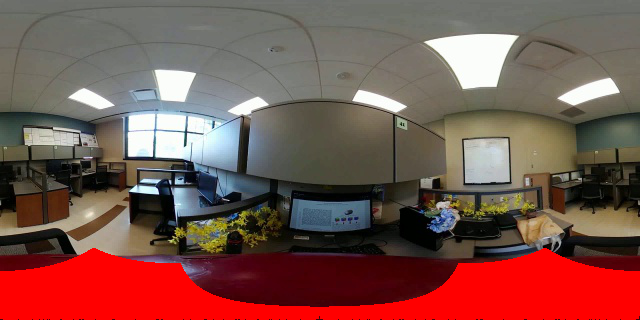

In [34]:
tweak(v_deg = -80.)

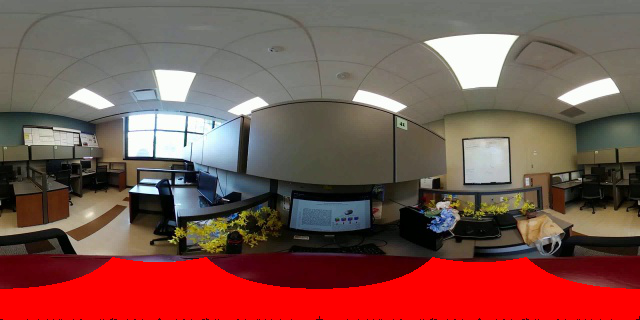

In [35]:
tweak(v_deg = -90., get_idx=False)

In [149]:
out,udi,vdi = getuvCenter(7,7)

tensor(30)


In [420]:
udi,vdi

(tensor(60), tensor(30))

In [151]:
from pypapi import events, papi_high as high

high.start_counters([events.PAPI_FP_OPS,])
# Do something
x=high.stop_counters()

ModuleNotFoundError: No module named 'pypapi'

In [ ]:
class :
    init
    
    @projector
    forward